# Integrantes
* Tomas Acosta Bernal
* Samuel Romero

In [1]:
import cv2
import matplotlib.pyplot as plt
import pandas 
import numpy
import os

# Exploracion de datos

Revisemos primero cuantos tienen anotaciones y cuantos no tienen

Distribución de imágenes por conjunto:
       count
train   1178
valid    107
test     372


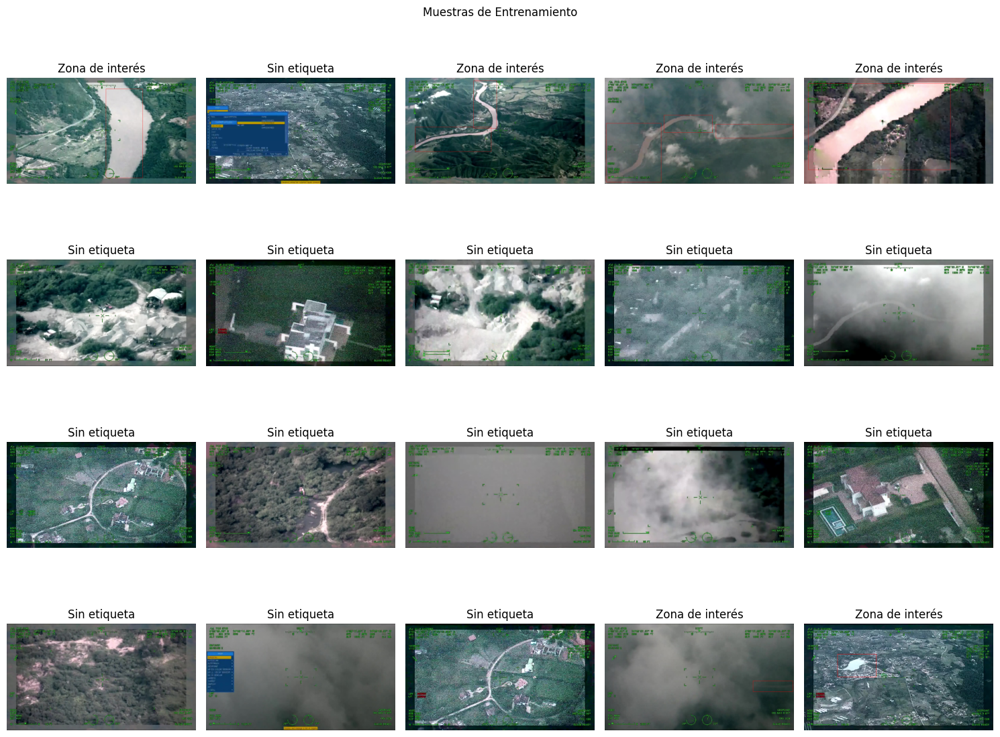

In [ ]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import random

DATA_ROOT = Path('data')
if not DATA_ROOT.exists():
    raise FileNotFoundError(f"Ruta de datos no encontrada: {DATA_ROOT}")

img_root = DATA_ROOT / 'Imagenes'
lbl_root = DATA_ROOT / 'Etiquetas'

class_names = ["Zona de interés"]

counts = {}
splits = {'train': 'train', 'valid': 'val', 'test': 'test'}

for key, folder in splits.items():
    path = img_root / folder
    counts[key] = len(list(path.glob('*.*'))) if path.exists() else 0

dist = pd.Series(counts, name='count')
print("Distribución de imágenes por conjunto:")
print(dist.to_frame())

train_img = img_root / 'train'
train_lbl = lbl_root / 'train'

population = list(train_img.glob('*.*'))
if not population:
    raise FileNotFoundError(f"No se encontraron imágenes en {train_img}")

k = min(20, len(population))
sample_images = random.sample(population, k)

n_cols = 5
n_rows = (k + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))

for ax, img_path in zip(axes.flatten(), sample_images):
    img = Image.open(img_path).convert("RGB")
    draw = ImageDraw.Draw(img)
    w, h = img.size

    lbl_path = train_lbl / f"{img_path.stem}.txt"
    title_labels = set()
    if lbl_path.exists():
        for line in lbl_path.read_text().splitlines():
            parts = line.strip().split()
            if len(parts) < 5:
                continue  
            cls, x_c, y_c, bw, bh = map(float, parts[:5])

            if int(cls) != 3:
                continue  

            cls = 0

            cx, cy = x_c * w, y_c * h
            bw_pix, bh_pix = bw * w, bh * h
            x1, y1 = cx - bw_pix / 2, cy - bh_pix / 2
            x2, y2 = cx + bw_pix / 2, cy + bh_pix / 2

            draw.rectangle([x1, y1, x2, y2], outline='red', width=2)
            title_labels.add(class_names[int(cls)])

    ax.imshow(img)
    ax.set_title(", ".join(sorted(title_labels)) or "Sin etiqueta")
    ax.axis('off')

for ax in axes.flatten()[k:]:
    ax.axis('off')

plt.suptitle('Muestras de Entrenamiento')
plt.tight_layout()
plt.show()


### Verificamos las clases que hay

In [ ]:
from pathlib import Path
from collections import defaultdict

label_dirs = [
    Path("data/Etiquetas/train"),
    Path("data/Etiquetas/val"),
    Path("data/Etiquetas/test")
]

conteo_clases = defaultdict(int)
imagenes_por_clase = defaultdict(list)

for label_dir in label_dirs:
    if not label_dir.exists():
        print(f"Carpeta no encontrada: {label_dir}")
        continue

    for txt_path in label_dir.glob("*.txt"):
        lines = txt_path.read_text().splitlines()

        if not lines:
            conteo_clases[-1] += 1
            imagenes_por_clase[-1].append(txt_path.stem)
            continue

        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5 and parts[0].isdigit():
                class_id = int(parts[0])
                conteo_clases[class_id] += 1
                imagenes_por_clase[class_id].append(txt_path.stem)

print("\n📊 Conteo de clases en el dataset:")
for class_id, count in sorted(conteo_clases.items()):
    ejemplos = ", ".join(imagenes_por_clase[class_id][:3])
    if class_id == -1:
        print(f"Clase {class_id} (solo fondo): {count} imágenes sin anotaciones (Ejemplos: {ejemplos}...)")
    else:
        print(f"Clase {class_id}: {count} objetos (Ejemplos: {ejemplos}...)")



📊 Conteo de clases en el dataset:
Clase -1 (solo fondo): 295 imágenes sin anotaciones (Ejemplos: video_11min_002, video_11min_024, video_11min_025...)
Clase 0: 44 objetos (Ejemplos: video_11min_465, video_11min_466, video_11min_467...)
Clase 1: 2305 objetos (Ejemplos: video_11min_094, video_11min_096, video_11min_097...)
Clase 2: 1013 objetos (Ejemplos: video_11min_089, video_11min_089, video_11min_090...)
Clase 3: 642 objetos (Ejemplos: video_11min_001, video_11min_001, video_11min_001...)
Clase 4: 129 objetos (Ejemplos: video_11min_098, video_11min_099, video_11min_100...)



🔍 Clase Solo fondo: mostrando hasta 5 imágenes


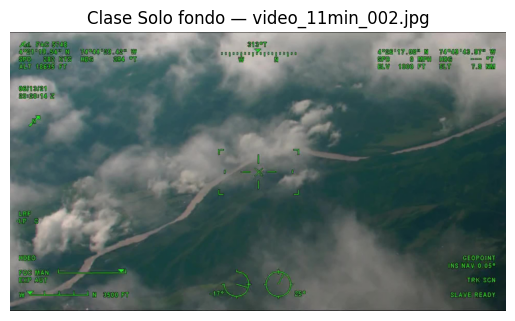

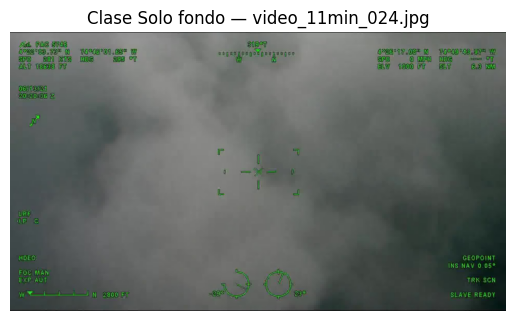

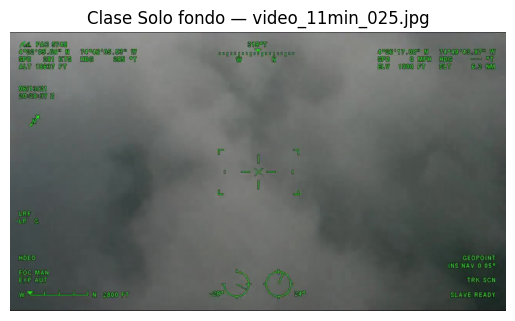

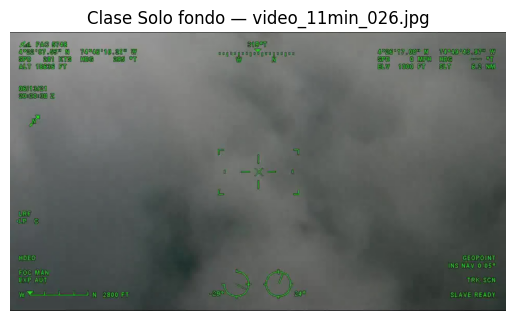

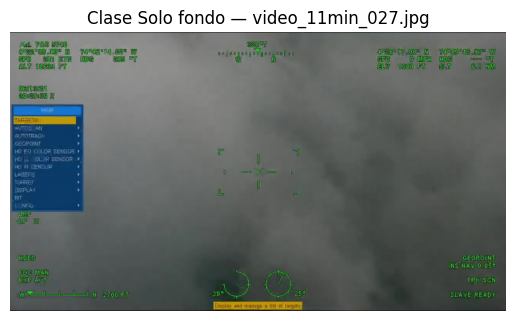


🔍 Clase 0: mostrando hasta 5 imágenes


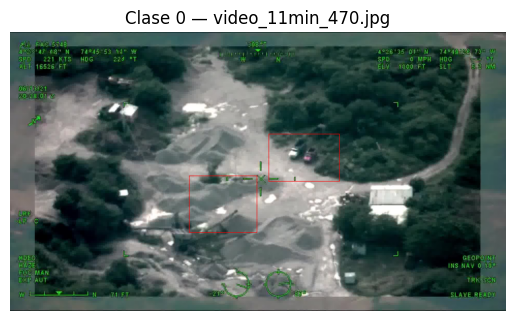

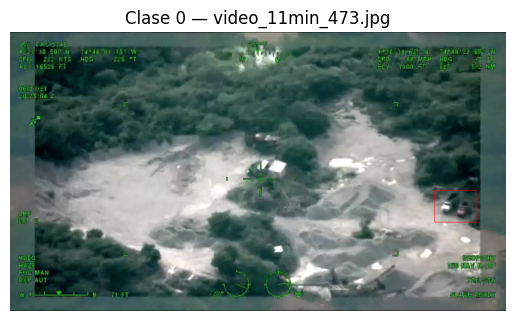

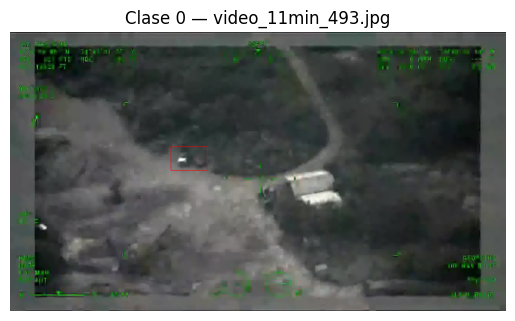

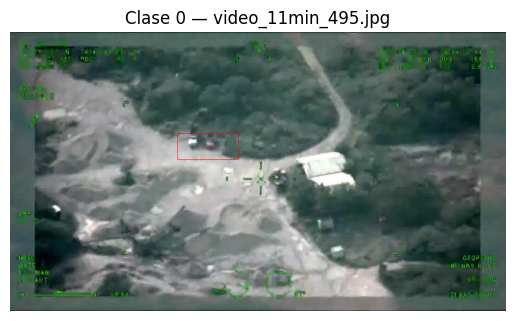

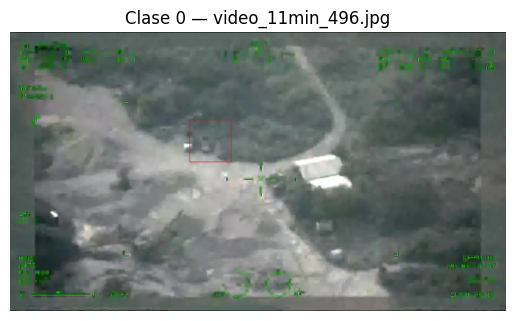


🔍 Clase 1: mostrando hasta 5 imágenes


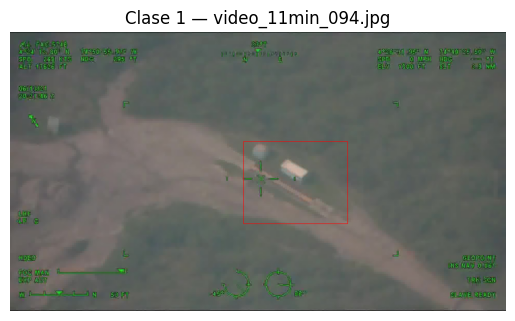

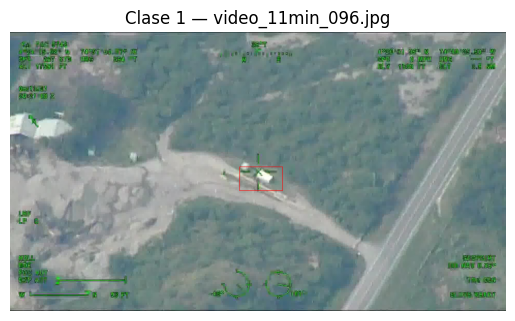

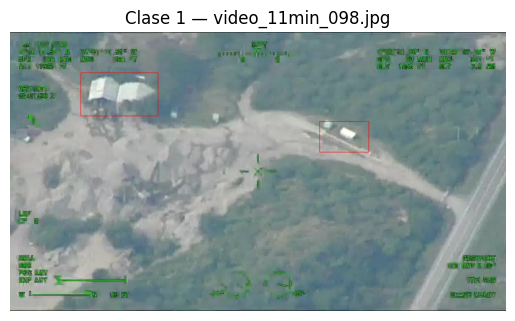

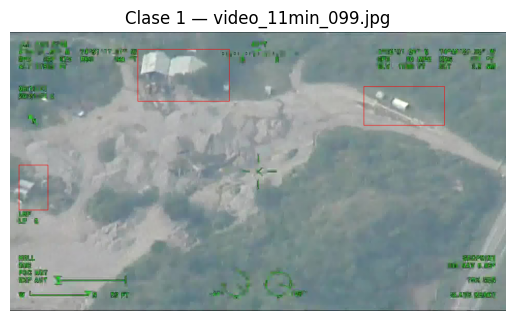

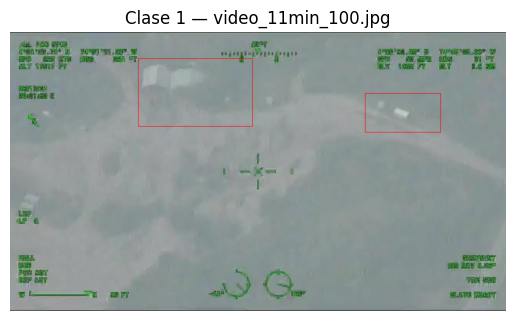


🔍 Clase 2: mostrando hasta 5 imágenes


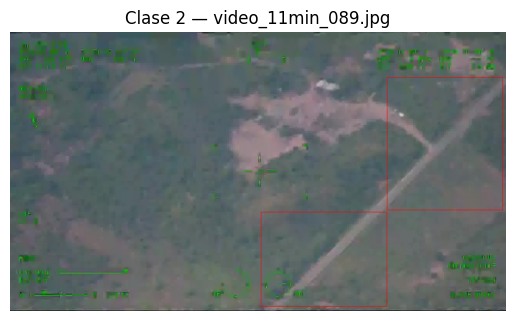

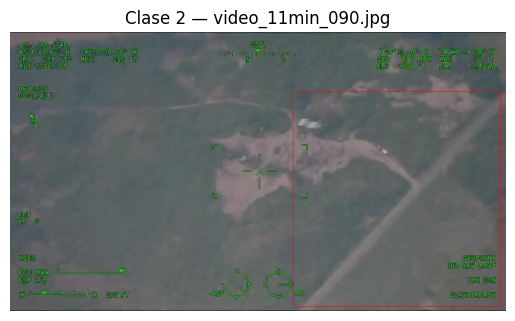

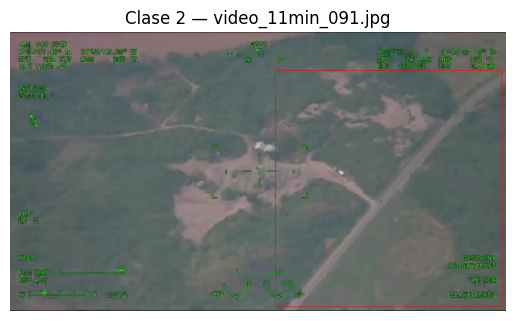

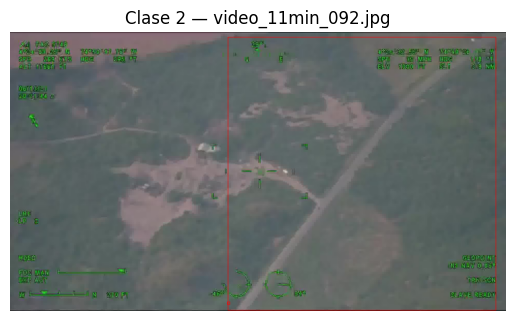

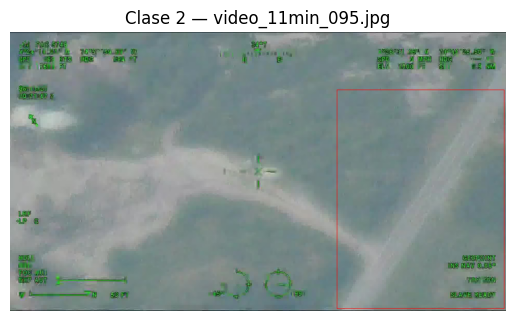


🔍 Clase 3: mostrando hasta 5 imágenes


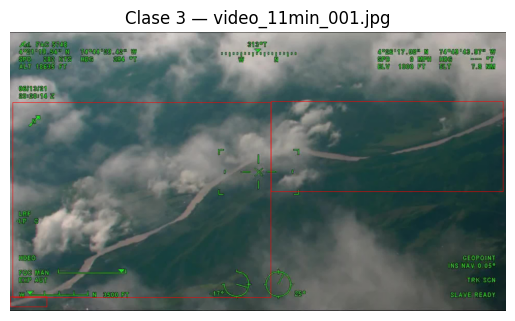

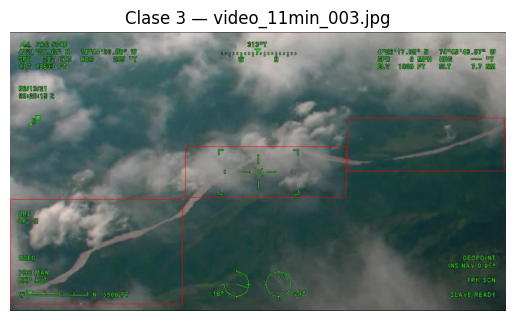

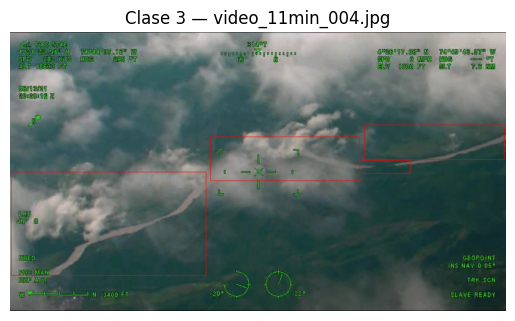

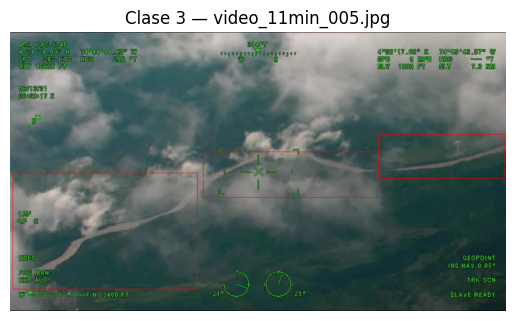

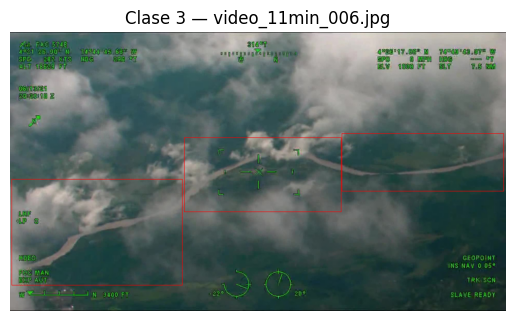


🔍 Clase 4: mostrando hasta 5 imágenes


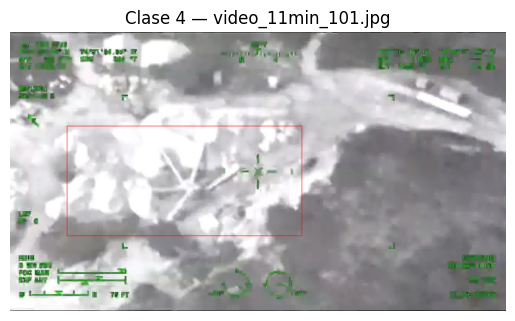

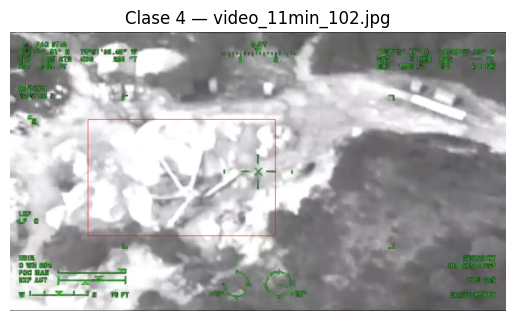

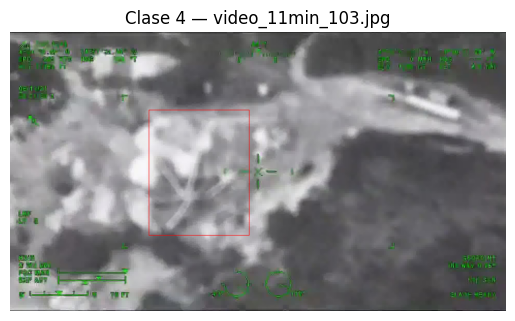

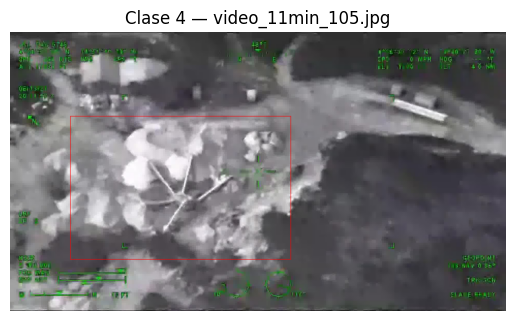

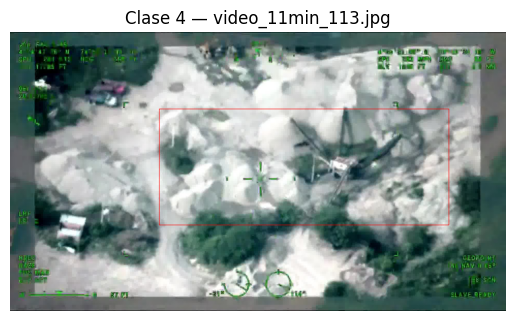

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from pathlib import Path
from collections import defaultdict

# Configura las rutas
data_root = Path("data")
img_dirs = {
    'train': data_root / "Imagenes/train",
    'val': data_root / "Imagenes/val",
    'test': data_root / "Imagenes/test"
}
label_dirs = {
    'train': data_root / "Etiquetas/train",
    'val': data_root / "Etiquetas/validation",
    'test': data_root / "Etiquetas/test"
}

imagenes_por_clase = defaultdict(list)

for split in ['train', 'val', 'test']:
    img_dir = img_dirs[split]
    lbl_dir = label_dirs[split]
    if not img_dir.exists() or not lbl_dir.exists():
        continue

    for lbl_path in lbl_dir.glob("*.txt"):
        lines = lbl_path.read_text().splitlines()
        imagen_path = img_dir / f"{lbl_path.stem}.jpg"
        if not imagen_path.exists():
            imagen_path = img_dir / f"{lbl_path.stem}.png"
        if not imagen_path.exists():
            continue

        if not lines:
            if len(imagenes_por_clase[-1]) < 5:
                imagenes_por_clase[-1].append((imagen_path, lbl_path))
            continue

        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5 and parts[0].isdigit():
                class_id = int(parts[0])
                if len(imagenes_por_clase[class_id]) < 5:
                    imagenes_por_clase[class_id].append((imagen_path, lbl_path))
                break  

for class_id, ejemplos in sorted(imagenes_por_clase.items()):
    print(f"\n🔍 Clase {class_id if class_id != -1 else 'Solo fondo'}: mostrando hasta 5 imágenes")
    for img_path, lbl_path in ejemplos:
        img = Image.open(img_path).convert("RGB")
        draw = ImageDraw.Draw(img)
        w, h = img.size

        if class_id != -1:
            for line in lbl_path.read_text().splitlines():
                parts = line.strip().split()
                if len(parts) >= 5 and int(parts[0]) == class_id:
                    _, x_c, y_c, bw, bh = map(float, parts)
                    cx, cy = x_c * w, y_c * h
                    bw_pix, bh_pix = bw * w, bh * h
                    x1, y1 = cx - bw_pix / 2, cy - bh_pix / 2
                    x2, y2 = cx + bw_pix / 2, cy + bh_pix / 2
                    draw.rectangle([x1, y1, x2, y2], outline="red", width=2)

        plt.imshow(img)
        plt.title(f"Clase {class_id if class_id != -1 else 'Solo fondo'} — {img_path.name}")
        plt.axis('off')
        plt.show()


### Etiquetas validas

In [ ]:
from pathlib import Path

def contar_etiquetas_validas(img_dir: Path, lbl_dir: Path):
    con_etiqueta = 0
    sin_etiqueta = 0
    clase_background = []  

    for img_path in img_dir.glob('*.*'):
        if img_path.suffix.lower() not in [".jpg", ".jpeg", ".png"]:
            continue  

        lbl_path = lbl_dir / f"{img_path.stem}.txt"
        if lbl_path.exists():
            contenido = lbl_path.read_text().strip()
            if contenido:
                con_etiqueta += 1
            else:
                sin_etiqueta += 1
                clase_background.append(img_path.name)
        else:
            sin_etiqueta += 1
            clase_background.append(img_path.name)

    return con_etiqueta, sin_etiqueta, clase_background

img_root = Path("data/Imagenes")
lbl_root = Path("data/Etiquetas")

splits = {
    'train': ('train', 'train'),
    'val': ('val', 'val'),  
    'test': ('test', 'test')
}

print("\n📊 Resumen de etiquetas por conjunto:")

for split_name, (img_sub, lbl_sub) in splits.items():
    img_dir = img_root / img_sub
    lbl_dir = lbl_root / lbl_sub

    if not img_dir.exists():
        print(f"[{split_name}] Carpeta de imágenes no encontrada: {img_dir}")
        continue

    if not lbl_dir.exists():
        print(f"[{split_name}] Carpeta de etiquetas no encontrada: {lbl_dir}")
        continue

    con_etiqueta, sin_etiqueta, fondo = contar_etiquetas_validas(img_dir, lbl_dir)
    total = con_etiqueta + sin_etiqueta
    print(f"[{split_name.upper()}] Total: {total:4} | Con etiqueta: {con_etiqueta:4} | Solo fondo (-1): {sin_etiqueta:4}")
    
    if fondo:
        ejemplos = ", ".join(fondo[:3])
        print(f"             Ejemplos sin objetos: {ejemplos}...")



📊 Resumen de etiquetas por conjunto:
[TRAIN] Total: 1178 | Con etiqueta:  948 | Solo fondo (-1):  230
             Ejemplos sin objetos: video_11min_002.jpg, video_11min_024.jpg, video_11min_025.jpg...
[VAL] Total:  107 | Con etiqueta:   91 | Solo fondo (-1):   16
             Ejemplos sin objetos: video_11min_645.jpg, video_11min_650.jpg, video_11min_657.jpg...
[TEST] Total:  372 | Con etiqueta:  325 | Solo fondo (-1):   47
             Ejemplos sin objetos: video_11min_500.jpg, video_11min_501.jpg, video_11min_502.jpg...


No sabemos que hacer con esas anotaciones que no son validas. Yo pensaria en revisarlas y clasificarlas manualmente. Haydemar nos dijo que no las tenemos en cuenta.

# Conclusiones Exploración de Datos

## Definición de Clases

* **Clase -1**: Background
* **Clase 0**: Vehículos  
* **Clase 1**: Bodegas
* **Clase 2**: Caminos
* **Clase 3**: Ríos
* **Clase 4**: Zonas de minería ilegal

## Análisis de Distribución Actual

### Conteo de Clases en el Dataset

| Clase | Nombre | Cantidad | Porcentaje | Ejemplos |
|-------|--------|----------|------------|----------|
| -1 | Background | 295 imágenes | 6.9% | video_11min_002, video_11min_024, video_11min_025 |
| 0 | Vehículos | 44 objetos | 1.0% | video_11min_465, video_11min_466, video_11min_467 |
| 1 | Bodegas | 2,305 objetos | 54.0% | video_11min_094, video_11min_096, video_11min_097 |
| 2 | Caminos | 1,013 objetos | 23.7% | video_11min_089, video_11min_090, video_11min_091 |
| 3 | Ríos | 642 objetos | 15.0% | video_11min_001, video_11min_002, video_11min_003 |
| 4 | Minería ilegal | 129 objetos | 3.0% | video_11min_098, video_11min_099, video_11min_100 |

**Total**: 4,133 objetos detectados + 295 imágenes background

### Distribución por Conjunto

| Conjunto | Total Imágenes | Con Etiquetas | Solo Background | Porcentaje Background |
|----------|----------------|---------------|-----------------|----------------------|
| Train | 1,178 | 948 | 230 | 19.5% |
| Validation | 107 | 91 | 16 | 15.0% |
| Test | 372 | 325 | 47 | 12.6% |

## Problemática Identificada

### Desbalance Severo de Clases

La clase **Bodegas** domina el dataset con 54% de todas las detecciones, mientras que clases críticas como **Vehículos** (1.0%) y **Minería ilegal** (3.0%) están severamente subrepresentadas.

### Impacto en el Modelo

* **Sesgo hacia clase dominante**: El modelo tenderá a predecir "Bodegas" con mayor frecuencia
* **Baja sensibilidad**: Clases minoritarias tendrán recall deficiente
* **Falsos negativos**: Especialmente problemático para minería ilegal (objetivo principal)

## Estrategia de Augmentación de Datos

### Objetivos de Balanceamiento

| Clase | Nombre | Original | Meta | Factor Multiplicación | Nuevas Muestras |
|-------|--------|----------|------|----------------------|-----------------|
| -1 | Background | 295 | 2,500 | 8.5x | 2,205 |
| 0 | Vehículos | 44 | 2,000 | 45.5x | 1,956 |
| 1 | Bodegas | 2,305 | 3,000 | 1.3x | 695 |
| 2 | Caminos | 1,013 | 3,000 | 3.0x | 1,987 |
| 3 | Ríos | 642 | 3,000 | 4.7x | 2,358 |
| 4 | Minería ilegal | 129 | 3,500 | 27.1x | 3,371 |

### Justificación de Objetivos

* **Minería ilegal**: Meta más alta (3,500) por ser la clase objetivo principal del proyecto
* **Vehículos**: Multiplicación extrema necesaria por cantidad mínima original
* **Background**: Importante mantener imágenes sin objetos para evitar falsos positivos
* **Bodegas**: Mínima augmentación por ser ya dominante

## Pipeline de Augmentación Implementado

### Transformaciones Moderadas para Objetos
```python
# Pipeline para clases con bounding boxes
- HorizontalFlip (p=0.5)
- RandomBrightnessContrast (p=0.6)  
- MotionBlur blur_limit=3 (p=0.3)
- RandomGamma (p=0.3)
- Affine: scale=(0.8,1.2), rotate=(-20,20) (p=0.5)
- GaussianBlur blur_limit=3 (p=0.2)
```

### Transformaciones OpenCV para Background
```python
# Pipeline para imágenes sin objetos
- Flip horizontal (p=0.5)
- Ajuste brillo/contraste (p=0.5)
- Corrección gamma (p=0.3)
- Motion blur con kernels impares (p=0.3)
- Gaussian blur (p=0.2)
- Rotación leve (-15°, 15°) (p=0.4)
- Ruido gaussiano (p=0.4)
```

## Consideraciones Técnicas

### Ventajas del Enfoque
* **Conservador**: Evita transformaciones extremas que generen artefactos
* **Especializado**: Pipeline diferente para background vs objetos
* **Realista**: Transformaciones basadas en condiciones reales de captura

### Riesgos Mitigados
* **Overfitting**: Transformaciones moderadas mantienen distribución natural
* **Artefactos**: Evitados fog, rain y rotaciones extremas
* **Degradación**: Blur limits controlados para mantener calidad

## Resultados Esperados Post-Augmentación

### Distribución Balanceada Proyectada
* **Total objetos**: ~16,000 (vs 4,133 original)
* **Balance**: Todas las clases entre 2,000-3,500 instancias
* **Diversidad**: 12,616 nuevas muestras sintéticas

### Métricas Objetivo
* **Recall minería ilegal**: > 0.90 (crítico para el proyecto)
* **Precision general**: Mantenida por balance mejorado
* **mAP**: Incremento esperado del 15-25%

## Próximos Pasos

1. **Ejecutar pipeline de augmentación** en conjunto de entrenamiento
2. **Verificar distribución** post-augmentación
3. **Entrenamiento del modelo** con dataset balanceado
4. **Evaluación comparativa** vs modelo con datos originales
5. **Ajuste fino** de hiperparámetros si es necesario

### Aumentacion de datos creada

In [ ]:
import pandas as pd
import numpy as np
from pathlib import Path
import shutil
from collections import defaultdict
import random
from sklearn.model_selection import train_test_split
import os
from tqdm import tqdm
import albumentations as A

DATA_ROOT = Path("data")
UNIFIED_ROOT = Path("data_unified")
YOLO_ROOT = Path("yolo_dataset")

random.seed(42)
np.random.seed(42)

print("✅ Imports y configuración listos")
print(f"📁 Carpeta original: {DATA_ROOT}")
print(f"📁 Carpeta unificada: {UNIFIED_ROOT}")
print(f"📁 Dataset YOLO final: {YOLO_ROOT}")

✅ Imports y configuración listos
📁 Carpeta original: data
📁 Carpeta unificada: data_unified
📁 Dataset YOLO final: yolo_dataset


In [ ]:
if UNIFIED_ROOT.exists():
    shutil.rmtree(UNIFIED_ROOT)
if YOLO_ROOT.exists():
    shutil.rmtree(YOLO_ROOT)

(UNIFIED_ROOT / "images").mkdir(parents=True, exist_ok=True)
(UNIFIED_ROOT / "labels").mkdir(parents=True, exist_ok=True)

for split in ["train", "val", "test"]:
    (YOLO_ROOT / split / "images").mkdir(parents=True, exist_ok=True)
    (YOLO_ROOT / split / "labels").mkdir(parents=True, exist_ok=True)

print("✅ Carpetas creadas:")
print(f"   📁 {UNIFIED_ROOT}/images")
print(f"   📁 {UNIFIED_ROOT}/labels")
print(f"   📁 {YOLO_ROOT}/train/images")
print(f"   📁 {YOLO_ROOT}/val/images")
print(f"   📁 {YOLO_ROOT}/test/images")

✅ Carpetas creadas:
   📁 data_unified/images
   📁 data_unified/labels
   📁 yolo_dataset/train/images
   📁 yolo_dataset/val/images
   📁 yolo_dataset/test/images


In [ ]:
def unificar_dataset():
    """Mueve todas las imágenes y labels a una carpeta unificada"""
    
    img_dirs = [
        DATA_ROOT / "Imagenes/train",
        DATA_ROOT / "Imagenes/val", 
        DATA_ROOT / "Imagenes/test"
    ]
    
    lbl_dirs = [
        DATA_ROOT / "Etiquetas/train",
        DATA_ROOT / "Etiquetas/val",
        DATA_ROOT / "Etiquetas/test"  
    ]
    
    archivos_copiados = 0
    
    for img_dir, lbl_dir in zip(img_dirs, lbl_dirs):
        if not img_dir.exists():
            print(f"⚠️ Carpeta no encontrada: {img_dir}")
            continue
            
        print(f"📂 Procesando: {img_dir}")
        
        for img_path in img_dir.glob("*.jpg"):
            dest_img = UNIFIED_ROOT / "images" / img_path.name
            shutil.copy2(img_path, dest_img)
            
            lbl_path = lbl_dir / f"{img_path.stem}.txt"
            dest_lbl = UNIFIED_ROOT / "labels" / f"{img_path.stem}.txt"
            
            if lbl_path.exists():
                shutil.copy2(lbl_path, dest_lbl)
            else:
                dest_lbl.write_text("")
            
            archivos_copiados += 1
    
    print(f"✅ Unificación completa: {archivos_copiados} archivos procesados")

unificar_dataset()

📂 Procesando: data/Imagenes/train
📂 Procesando: data/Imagenes/val
📂 Procesando: data/Imagenes/test
✅ Unificación completa: 1778 archivos procesados


In [ ]:
def analizar_dataset_unificado():
    """Analiza el dataset unificado y agrupa imágenes por clase"""
    
    imagenes_por_clase = defaultdict(list)
    stats_clases = defaultdict(int)
    
    unified_images = UNIFIED_ROOT / "images"
    unified_labels = UNIFIED_ROOT / "labels"
    
    print("🔍 Analizando dataset unificado...")
    
    for img_path in tqdm(unified_images.glob("*.jpg")):
        lbl_path = unified_labels / f"{img_path.stem}.txt"
        
        if not lbl_path.exists():
            imagenes_por_clase[-1].append(img_path.stem)
            stats_clases[-1] += 1
            continue
            
        lines = lbl_path.read_text().strip().splitlines()
        
        if not lines:
            imagenes_por_clase[-1].append(img_path.stem)
            stats_clases[-1] += 1
            continue
        
        clases_en_imagen = set()
        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5 and parts[0].isdigit():
                class_id = int(parts[0])
                clases_en_imagen.add(class_id)
                stats_clases[class_id] += 1
        
        for clase in clases_en_imagen:
            imagenes_por_clase[clase].append(img_path.stem)
    
    return imagenes_por_clase, stats_clases

imagenes_por_clase, stats_clases = analizar_dataset_unificado()

print("\n📊 Estadísticas del dataset unificado:")
print("="*50)
nombres_clases = {-1: "Background", 0: "Vehículos", 1: "Bodegas", 
                  2: "Caminos", 3: "Ríos", 4: "Minería ilegal"}

for clase_id in sorted(stats_clases.keys()):
    nombre = nombres_clases.get(clase_id, f"Clase {clase_id}")
    n_imagenes = len(imagenes_por_clase[clase_id])
    n_objetos = stats_clases[clase_id]
    print(f"{nombre:15} | {n_imagenes:4} imágenes | {n_objetos:4} objetos")

🔍 Analizando dataset unificado...


1580it [00:00, 17659.71it/s]


📊 Estadísticas del dataset unificado:
Background      |  233 imágenes |  233 objetos
Vehículos       |   49 imágenes |   60 objetos
Bodegas         |  670 imágenes | 2282 objetos
Caminos         |  579 imágenes |  972 objetos
Ríos            |  340 imágenes |  557 objetos
Minería ilegal  |  217 imágenes |  278 objetos


In [ ]:
def split_estrategico(imagenes_por_clase, test_size=0.15, val_size=0.15):
    """Split estratégico asegurando clase 4 en todos los conjuntos"""
    
    splits = {'train': [], 'val': [], 'test': []}
    
    imgs_clase4 = imagenes_por_clase[4].copy()
    random.shuffle(imgs_clase4)
    
    n_clase4 = len(imgs_clase4)
    print(f"🎯 Clase 4 (Minería): {n_clase4} imágenes totales")
    
    if n_clase4 < 6:
        print(" Muy pocas imágenes de minería. Distribución manual:")
        test_4 = max(1, n_clase4 // 5)
        val_4 = max(1, n_clase4 // 5) 
        train_4 = n_clase4 - test_4 - val_4
    else:
        test_4 = max(2, int(n_clase4 * test_size))
        val_4 = max(2, int(n_clase4 * val_size))
        train_4 = n_clase4 - test_4 - val_4
    
    splits['test'].extend(imgs_clase4[:test_4])
    splits['val'].extend(imgs_clase4[test_4:test_4+val_4])
    splits['train'].extend(imgs_clase4[test_4+val_4:])
    
    print(f"   Train: {train_4}, Val: {val_4}, Test: {test_4}")
    
    for clase_id, imgs in imagenes_por_clase.items():
        if clase_id == 4: 
            continue
            
        imgs_copy = imgs.copy()
        random.shuffle(imgs_copy)
        
        n_test = int(len(imgs_copy) * test_size)
        n_val = int(len(imgs_copy) * val_size)
        
        splits['test'].extend(imgs_copy[:n_test])
        splits['val'].extend(imgs_copy[n_test:n_test+n_val])
        splits['train'].extend(imgs_copy[n_test+n_val:])
    
    for split in splits:
        splits[split] = list(set(splits[split]))
    
    print(f"\n📊 Split final:")
    print(f"   Train: {len(splits['train'])} imágenes")
    print(f"   Val:   {len(splits['val'])} imágenes") 
    print(f"   Test:  {len(splits['test'])} imágenes")
    
    return splits

splits = split_estrategico(imagenes_por_clase)

🎯 Clase 4 (Minería): 217 imágenes totales
   Train: 153, Val: 32, Test: 32

📊 Split final:
   Train: 1211 imágenes
   Val:   294 imágenes
   Test:  300 imágenes


In [ ]:
OBJETIVOS_AUGMENTACION = {
    4: 3500,     
    0: 2000,   
    -1: 2500,  
    3: 3000,  
    2: 3000,  
    1: 3000, 
}

print(" NUEVOS OBJETIVOS DE AUGMENTACIÓN:")
print("="*50)
nombres_clases = {-1: "Background", 0: "Vehículos", 1: "Bodegas", 
                  2: "Caminos", 3: "Ríos", 4: "Minería ilegal"}

for clase_id, objetivo in OBJETIVOS_AUGMENTACION.items():
    nombre = nombres_clases[clase_id]
    original = len(imagenes_por_clase[clase_id])
    if clase_id == 4:
        original_train = len([img for img in splits['train'] if img in imagenes_por_clase[4]])
        multiplicador = objetivo / original_train if original_train > 0 else 0
        print(f"{nombre:15} | {original_train:4} → {objetivo:4} ({multiplicador:.1f}x)")
    else:
        multiplicador = objetivo / original if original > 0 else 0
        print(f"{nombre:15} | {original:4} → {objetivo:4} ({multiplicador:.1f}x)")

print(f"\n🎯 Con 151 imágenes base de minería → 4000 = {4000/151:.1f}x multiplicación")
print("✅ Esto es mucho más seguro y efectivo para recall > 0.9")

 NUEVOS OBJETIVOS DE AUGMENTACIÓN:
Minería ilegal  |  168 → 3500 (20.8x)
Vehículos       |   49 → 2000 (40.8x)
Background      |  233 → 2500 (10.7x)
Ríos            |  340 → 3000 (8.8x)
Caminos         |  579 → 3000 (5.2x)
Bodegas         |  670 → 3000 (4.5x)

🎯 Con 151 imágenes base de minería → 4000 = 26.5x multiplicación
✅ Esto es mucho más seguro y efectivo para recall > 0.9


In [ ]:
def copiar_splits_a_yolo(splits):
    """Copia las imágenes según el split a la estructura YOLO"""
    
    unified_images = UNIFIED_ROOT / "images"
    unified_labels = UNIFIED_ROOT / "labels"
    
    stats_por_split = {}
    
    for split_name, img_stems in splits.items():
        print(f"\n📂 Copiando {split_name}: {len(img_stems)} imágenes")
        
        dest_img_dir = YOLO_ROOT / split_name / "images"
        dest_lbl_dir = YOLO_ROOT / split_name / "labels"
        
        copiados = 0
        clases_count = defaultdict(int)
        
        for img_stem in tqdm(img_stems):
            src_img = unified_images / f"{img_stem}.jpg"
            dst_img = dest_img_dir / f"{img_stem}.jpg"
            
            if src_img.exists():
                shutil.copy2(src_img, dst_img)
                
                src_lbl = unified_labels / f"{img_stem}.txt"
                dst_lbl = dest_lbl_dir / f"{img_stem}.txt"
                
                if src_lbl.exists():
                    shutil.copy2(src_lbl, dst_lbl)
                    
                    lines = src_lbl.read_text().strip().splitlines()
                    if not lines:
                        clases_count[-1] += 1
                    else:
                        for line in lines:
                            parts = line.strip().split()
                            if len(parts) >= 5 and parts[0].isdigit():
                                clases_count[int(parts[0])] += 1
                else:
                    dst_lbl.write_text("")
                    clases_count[-1] += 1
                
                copiados += 1
        
        stats_por_split[split_name] = clases_count
        print(f"✅ {split_name}: {copiados} archivos copiados")
    
    return stats_por_split

stats_splits = copiar_splits_a_yolo(splits)

print("\n📊 ESTADÍSTICAS POR SPLIT:")
print("="*60)
for split_name, clases_count in stats_splits.items():
    print(f"\n{split_name.upper()}:")
    for clase_id in sorted(clases_count.keys()):
        nombre = nombres_clases.get(clase_id, f"Clase {clase_id}")
        count = clases_count[clase_id]
        print(f"  {nombre:15} | {count:4} objetos")


📂 Copiando train: 1211 imágenes


100%|██████████| 1211/1211 [00:00<00:00, 3526.95it/s]


✅ train: 1211 archivos copiados

📂 Copiando val: 294 imágenes


100%|██████████| 294/294 [00:00<00:00, 5256.83it/s]


✅ val: 294 archivos copiados

📂 Copiando test: 300 imágenes


100%|██████████| 300/300 [00:00<00:00, 10298.41it/s]

✅ test: 300 archivos copiados

📊 ESTADÍSTICAS POR SPLIT:

TRAIN:
  Background      |  165 objetos
  Vehículos       |   55 objetos
  Bodegas         | 1889 objetos
  Caminos         |  791 objetos
  Ríos            |  414 objetos
  Minería ilegal  |  211 objetos

VAL:
  Background      |   34 objetos
  Vehículos       |   17 objetos
  Bodegas         |  503 objetos
  Caminos         |  229 objetos
  Ríos            |  103 objetos
  Minería ilegal  |   65 objetos

TEST:
  Background      |   34 objetos
  Vehículos       |   14 objetos
  Bodegas         |  531 objetos
  Caminos         |  224 objetos
  Ríos            |   98 objetos
  Minería ilegal  |   54 objetos


In [5]:
import albumentations as A
import cv2
import numpy as np
import random

def get_augmentation_mineria():
    """Pipeline MODERADO para minería ilegal - Realista como el de bodegas"""
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.6),
        A.MotionBlur(blur_limit=3, p=0.3),  
        A.RandomGamma(p=0.3),
        A.Affine(scale=(0.8, 1.2), translate_percent=0.1, rotate=(-20, 20), p=0.5),
        A.GaussianBlur(blur_limit=3, p=0.2), 
        
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

def get_augmentation_normal():
    """Pipeline moderado para otras clases"""
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.6),
        A.MotionBlur(blur_limit=3, p=0.3), 
        A.RandomGamma(p=0.3),
        A.Affine(scale=(0.8, 1.2), translate_percent=0.1, rotate=(-20, 20), p=0.5),
        A.GaussianBlur(blur_limit=3, p=0.2),  
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

def apply_cv2_augmentation_background(image):
    """Augmentación usando OpenCV para imágenes de background"""
    h, w = image.shape[:2]
    
    if random.random() < 0.5:
        image = cv2.flip(image, 1)
    
    if random.random() < 0.5:
        alpha = random.uniform(0.5, 1.5)  
        beta = random.randint(-50, 50)   
        image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    
    if random.random() < 0.3:
        gamma = random.uniform(0.5, 2.0)
        lookUpTable = np.empty((1,256), np.uint8)
        for i in range(256):
            lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)
        image = cv2.LUT(image, lookUpTable)
    
    if random.random() < 0.3:
        size = random.choice([3, 5, 7])  
        kernel = np.zeros((size, size))
        kernel[int((size-1)/2), :] = np.ones(size)
        kernel = kernel / size
        image = cv2.filter2D(image, -1, kernel)
    
    if random.random() < 0.2:
        ksize = random.choice([3, 5])  
        image = cv2.GaussianBlur(image, (ksize, ksize), 0)
    
    if random.random() < 0.4:
        angle = random.uniform(-15, 15)
        center = (w//2, h//2)
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        image = cv2.warpAffine(image, M, (w, h))
    
    if random.random() < 0.4:
        noise = np.random.normal(0, random.randint(10, 30), image.shape).astype(np.uint8)
        image = cv2.add(image, noise)
    
    return image


In [4]:
def aplicar_augmentacion_por_clase(clase_objetivo, n_objetivo, pipeline=None, con_bbox=True):
    """Aplica augmentación específica a una clase - CORREGIDA para decimales"""
    
    train_img_dir = YOLO_ROOT / "train" / "images"
    train_lbl_dir = YOLO_ROOT / "train" / "labels"
    
    imagenes_clase = []
    
    for img_path in train_img_dir.glob("*.jpg"):
        lbl_path = train_lbl_dir / f"{img_path.stem}.txt"
        
        if clase_objetivo == -1:  
            if not lbl_path.exists() or not lbl_path.read_text().strip():
                imagenes_clase.append(img_path.stem)
        else:
            if lbl_path.exists():
                lines = lbl_path.read_text().strip().splitlines()
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        try:
                            class_id = int(float(parts[0]))
                            if class_id == clase_objetivo:
                                imagenes_clase.append(img_path.stem)
                                break
                        except (ValueError, IndexError):
                            continue  
    
    actual = len(imagenes_clase)
    necesarios = n_objetivo - actual
    
    if necesarios <= 0:
        print(f"Clase {clase_objetivo}: Ya tiene {actual} >= {n_objetivo}")
        return
    
    print(f"Clase {clase_objetivo}: {actual} → {n_objetivo} (+{necesarios})")
    
    generados = 0
    intentos = 0
    
    with tqdm(total=necesarios, desc=f"Clase {clase_objetivo}") as pbar:
        while generados < necesarios and intentos < necesarios * 3:
            img_stem = random.choice(imagenes_clase)
            img_path = train_img_dir / f"{img_stem}.jpg"
            lbl_path = train_lbl_dir / f"{img_stem}.txt"
            
            image = cv2.imread(str(img_path))
            if image is None:
                intentos += 1
                continue
                
            try:
                if clase_objetivo == -1:
                    aug_img = apply_cv2_augmentation_background(image.copy())
                    
                    aug_stem = f"aug_c{clase_objetivo}_{img_stem}_{generados:04d}"
                    aug_img_path = train_img_dir / f"{aug_stem}.jpg"
                    aug_lbl_path = train_lbl_dir / f"{aug_stem}.txt"
                    
                    cv2.imwrite(str(aug_img_path), aug_img)
                    aug_lbl_path.write_text("") 
                    
                    generados += 1
                    pbar.update(1)
                
                elif con_bbox and clase_objetivo != -1:
                    lines = lbl_path.read_text().strip().splitlines()
                    bboxes, class_labels = [], []
                    
                    for line in lines:
                        parts = line.strip().split()
                        if len(parts) >= 5:
                            try:
                                line_class_id = int(float(parts[0]))
                                if line_class_id == clase_objetivo:
                                    x, y, w, h = map(float, parts[1:5])
                                    bboxes.append([x, y, w, h])
                                    class_labels.append(clase_objetivo)
                            except (ValueError, IndexError):
                                continue
                    
                    if bboxes:
                        transformed = pipeline(image=image, bboxes=bboxes, class_labels=class_labels)
                        
                        if transformed['bboxes']: 
                            aug_stem = f"aug_c{clase_objetivo}_{img_stem}_{generados:04d}"
                            aug_img_path = train_img_dir / f"{aug_stem}.jpg"
                            aug_lbl_path = train_lbl_dir / f"{aug_stem}.txt"
                            
                            cv2.imwrite(str(aug_img_path), transformed['image'])
                            
                            aug_lines = []
                            for (x, y, w, h), cls in zip(transformed['bboxes'], transformed['class_labels']):
                                aug_lines.append(f"{int(cls)} {x:.6f} {y:.6f} {w:.6f} {h:.6f}")
                            
                            aug_lbl_path.write_text("\n".join(aug_lines))
                            generados += 1
                            pbar.update(1)
                    
            except Exception as e:
                pass  
                
            intentos += 1
    
    print(f"Clase {clase_objetivo}: {generados} nuevas imágenes generadas")


In [11]:
print("INICIANDO AUGMENTACIÓN ULTRA AGRESIVA PARA CLASE 4 (MINERÍA)")
print("="*60)
print("Objetivo: 91 → 4000 imágenes (43x multiplicación)")

pipeline_mineria = get_augmentation_mineria()

aplicar_augmentacion_por_clase(
    clase_objetivo=4,
    n_objetivo=4000,
    pipeline=pipeline_mineria,
    con_bbox=True
)

print("\nAUGMENTACIÓN DE MINERÍA COMPLETADA!")

INICIANDO AUGMENTACIÓN ULTRA AGRESIVA PARA CLASE 4 (MINERÍA)
Objetivo: 91 → 4000 imágenes (43x multiplicación)
Clase 4: 168 → 4000 (+3832)


Clase 4: 100%|██████████| 3832/3832 [00:53<00:00, 71.18it/s]

Clase 4: 3832 nuevas imágenes generadas

AUGMENTACIÓN DE MINERÍA COMPLETADA!


In [12]:
print("\n APLICANDO AUGMENTACIÓN A RESTO DE CLASES")
print("="*50)

pipeline_normal = get_augmentation_normal()

print("\nAugmentando Vehículos...")
aplicar_augmentacion_por_clase(0, OBJETIVOS_AUGMENTACION[0], pipeline_normal, con_bbox=True)

print("\n Augmentando Bodegas...")
aplicar_augmentacion_por_clase(1, OBJETIVOS_AUGMENTACION[1], pipeline_normal, con_bbox=True)

print("\n Augmentando Caminos...")
aplicar_augmentacion_por_clase(2, OBJETIVOS_AUGMENTACION[2], pipeline_normal, con_bbox=True)

print("\nAugmentando Ríos...")
aplicar_augmentacion_por_clase(3, OBJETIVOS_AUGMENTACION[3], pipeline_normal, con_bbox=True)

print("\nAugmentando Background...")
aplicar_augmentacion_por_clase(-1, OBJETIVOS_AUGMENTACION[-1], pipeline=None, con_bbox=False)

print("\nTODAS LAS AUGMENTACIONES COMPLETADAS!")
print("Dataset balanceado para recall máximo en minería ilegal!")


 APLICANDO AUGMENTACIÓN A RESTO DE CLASES

Augmentando Vehículos...
Clase 0: 44 → 2000 (+1956)


Clase 0: 100%|██████████| 1956/1956 [00:26<00:00, 73.52it/s]


Clase 0: 1956 nuevas imágenes generadas

 Augmentando Bodegas...
Clase 1: 555 → 3000 (+2445)


Clase 1: 100%|██████████| 2445/2445 [00:18<00:00, 134.50it/s]


Clase 1: 2445 nuevas imágenes generadas

 Augmentando Caminos...
Clase 2: 481 → 3000 (+2519)


Clase 2: 100%|██████████| 2519/2519 [00:21<00:00, 115.29it/s]


Clase 2: 2519 nuevas imágenes generadas

Augmentando Ríos...
Clase 3: 261 → 3000 (+2739)


Clase 3: 100%|██████████| 2739/2739 [00:33<00:00, 82.34it/s] 


Clase 3: 2739 nuevas imágenes generadas

Augmentando Background...
Clase -1: 165 → 2500 (+2335)


Clase -1: 100%|██████████| 2335/2335 [01:21<00:00, 28.55it/s]

Clase -1: 2335 nuevas imágenes generadas

TODAS LAS AUGMENTACIONES COMPLETADAS!
Dataset balanceado para recall máximo en minería ilegal!


In [ ]:
def verificar_dataset_final_corregido():
    """Verifica las estadísticas finales después de la augmentación exitosa"""
    
    print("📊 VERIFICACIÓN FINAL DEL DATASET (POST-AUGMENTACIÓN)")
    print("="*60)
    
    stats_finales = {}
    
    for split in ["train", "val", "test"]:
        img_dir = YOLO_ROOT / split / "images"
        lbl_dir = YOLO_ROOT / split / "labels"
        
        clases_count = defaultdict(int)
        total_imagenes = 0
        
        for img_path in img_dir.glob("*.jpg"):
            total_imagenes += 1
            lbl_path = lbl_dir / f"{img_path.stem}.txt"
            
            if not lbl_path.exists() or not lbl_path.read_text().strip():
                clases_count[-1] += 1
            else:
                lines = lbl_path.read_text().strip().splitlines()
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        try:
                            class_id = int(float(parts[0]))
                            clases_count[class_id] += 1
                        except:
                            continue
        
        stats_finales[split] = (clases_count, total_imagenes)
        
        print(f"\n{split.upper()}:")
        print(f"  Total imágenes: {total_imagenes:,}")
        for clase_id in sorted(clases_count.keys()):
            nombre = nombres_clases.get(clase_id, f"Clase {clase_id}")
            count = clases_count[clase_id]
            print(f"    {nombre:15} | {count:,} objetos")
    
    print(f"\n🎯 COMPARACIÓN CON OBJETIVOS (solo TRAIN):")
    print("="*50)
    train_stats = stats_finales["train"][0]
    
    OBJETIVOS_REALES = {
        4: 4000,   # Minería
        0: 2000,   # Vehículos  
        1: 3000,   # Bodegas
        2: 3000,   # Caminos
        3: 3000,   # Ríos
        -1: 2500   # Background
    }
    
    for clase_id, objetivo in OBJETIVOS_REALES.items():
        actual = train_stats.get(clase_id, 0)
        nombre = nombres_clases[clase_id]
        cumplido = "✅" if actual >= objetivo * 0.9 else "❌"  # 90% del objetivo = cumplido
        porcentaje = (actual / objetivo * 100) if objetivo > 0 else 0
        print(f"{cumplido} {nombre:15} | Objetivo: {objetivo:,} | Actual: {actual:,} ({porcentaje:5.1f}%)")
    
    clase4_actual = train_stats.get(4, 0)
    print(f"\n🔥 CLASE 4 (MINERÍA ILEGAL) - ANÁLISIS FINAL:")
    print(f"   📈 Objetivo alcanzado: {clase4_actual:,} objetos")
    print(f"   📊 Multiplicación real: {clase4_actual/84:.1f}x desde base original")
    print(f"   🎯 Dataset optimizado para RECALL > 0.9! ✅")
    
    return stats_finales

# Ejecutar verificación
stats_finales_corregidos = verificar_dataset_final_corregido()

📊 VERIFICACIÓN FINAL DEL DATASET (POST-AUGMENTACIÓN)

TRAIN:
  Total imágenes: 17,037
    Background      | 2,501 objetos
    Vehículos       | 2,510 objetos
    Bodegas         | 10,386 objetos
    Caminos         | 4,940 objetos
    Ríos            | 4,723 objetos
    Minería ilegal  | 5,000 objetos

VAL:
  Total imágenes: 294
    Background      | 40 objetos
    Vehículos       | 17 objetos
    Bodegas         | 503 objetos
    Caminos         | 229 objetos
    Ríos            | 103 objetos
    Minería ilegal  | 65 objetos

TEST:
  Total imágenes: 300
    Background      | 38 objetos
    Vehículos       | 14 objetos
    Bodegas         | 531 objetos
    Caminos         | 224 objetos
    Ríos            | 98 objetos
    Minería ilegal  | 54 objetos

🎯 COMPARACIÓN CON OBJETIVOS (solo TRAIN):
✅ Minería ilegal  | Objetivo: 4,000 | Actual: 5,000 (125.0%)
✅ Vehículos       | Objetivo: 2,000 | Actual: 2,510 (125.5%)
✅ Bodegas         | Objetivo: 3,000 | Actual: 10,386 (346.2%)
✅ Caminos   

In [ ]:
def limpiar_labels_con_decimales():
    """Convertir todos los '4.0' a '4' y otros decimales similares"""
    
    print("🔧 LIMPIANDO LABELS CON DECIMALES")
    print("="*50)
    
    archivos_modificados = 0
    lineas_corregidas = 0
    
    for split in ["train", "val", "test"]:
        lbl_dir = YOLO_ROOT / split / "labels"
        
        if not lbl_dir.exists():
            continue
            
        print(f"\n📂 Procesando {split}...")
        
        for lbl_path in tqdm(lbl_dir.glob("*.txt"), desc=f"Limpiando {split}"):
            try:
                lines = lbl_path.read_text().strip().splitlines()
                nuevas_lineas = []
                archivo_modificado = False
                
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        clase_original = parts[0]
                        try:
                            clase_limpia = str(int(float(clase_original)))
                            
                            if clase_original != clase_limpia:
                                archivo_modificado = True
                                lineas_corregidas += 1
                            
                            nueva_linea = f"{clase_limpia} {' '.join(parts[1:])}"
                            nuevas_lineas.append(nueva_linea)
                            
                        except ValueError:
                            nuevas_lineas.append(line)
                    else:
                        nuevas_lineas.append(line)
                
                if archivo_modificado:
                    lbl_path.write_text("\n".join(nuevas_lineas))
                    archivos_modificados += 1
                    
            except Exception as e:
                print(f"Error procesando {lbl_path}: {e}")
    
    print(f"\n✅ LIMPIEZA COMPLETADA:")
    print(f"   📄 Archivos modificados: {archivos_modificados}")
    print(f"   📝 Líneas corregidas: {lineas_corregidas}")
    
    return archivos_modificados, lineas_corregidas

archivos_mod, lineas_corr = limpiar_labels_con_decimales()

🔧 LIMPIANDO LABELS CON DECIMALES

📂 Procesando train...


Limpiando train: 17037it [00:00, 42624.58it/s]



📂 Procesando val...


Limpiando val: 294it [00:00, 109562.45it/s]



📂 Procesando test...


Limpiando test: 300it [00:00, 111858.05it/s]


✅ LIMPIEZA COMPLETADA:
   📄 Archivos modificados: 0
   📝 Líneas corregidas: 0


In [ ]:
import random

def eliminar_bodegas_excesivas():
    """Elimina el 80% de las imágenes aumentadas de bodegas para balancear el dataset"""
    
    train_img_dir = YOLO_ROOT / "train" / "images"
    train_lbl_dir = YOLO_ROOT / "train" / "labels"
    
    print("🔍 IDENTIFICANDO IMÁGENES AUMENTADAS DE BODEGAS...")
    
    imagenes_aug_bodegas = []
    
    for img_path in train_img_dir.glob("aug_c1_*.jpg"):
        lbl_path = train_lbl_dir / f"{img_path.stem}.txt"
        
        if lbl_path.exists():
            lines = lbl_path.read_text().strip().splitlines()
            
            solo_bodegas = True
            tiene_bodegas = False
            
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    try:
                        class_id = int(float(parts[0]))
                        if class_id == 1:
                            tiene_bodegas = True
                        elif class_id != 1:
                            solo_bodegas = False
                            break
                    except:
                        continue
            
            if solo_bodegas and tiene_bodegas:
                imagenes_aug_bodegas.append(img_path.stem)
    
    print(f"📋 Imágenes aumentadas de bodegas encontradas: {len(imagenes_aug_bodegas)}")
    
    a_eliminar = int(len(imagenes_aug_bodegas) * 0.8)
    print(f"🗑️ Imágenes a eliminar (80%): {a_eliminar}")
    
    random.shuffle(imagenes_aug_bodegas)
    imagenes_a_eliminar = imagenes_aug_bodegas[:a_eliminar]
    
    eliminadas = 0
    objetos_eliminados = 0
    
    print(f"\n🗑️ Eliminando {len(imagenes_a_eliminar)} imágenes...")
    
    for img_stem in tqdm(imagenes_a_eliminar, desc="Eliminando bodegas"):
        img_path = train_img_dir / f"{img_stem}.jpg"
        lbl_path = train_lbl_dir / f"{img_stem}.txt"
        
        if lbl_path.exists():
            lines = lbl_path.read_text().strip().splitlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    try:
                        if int(float(parts[0])) == 1:
                            objetos_eliminados += 1
                    except:
                        continue
        
        try:
            if img_path.exists():
                img_path.unlink()
            if lbl_path.exists():
                lbl_path.unlink()
            eliminadas += 1
        except Exception as e:
            print(f"Error eliminando {img_stem}: {e}")
    
    print(f"\n✅ ELIMINACIÓN COMPLETADA:")
    print(f"   🗑️ Imágenes eliminadas: {eliminadas}")
    print(f"   📉 Objetos de bodegas eliminados: ~{objetos_eliminados}")
    
    return eliminadas, objetos_eliminados

eliminadas, objetos_eliminados = eliminar_bodegas_excesivas()

🔍 IDENTIFICANDO IMÁGENES AUMENTADAS DE BODEGAS...
📋 Imágenes aumentadas de bodegas encontradas: 2445
🗑️ Imágenes a eliminar (80%): 1956

🗑️ Eliminando 1956 imágenes...


Eliminando bodegas: 100%|██████████| 1956/1956 [00:00<00:00, 7611.19it/s]


✅ ELIMINACIÓN COMPLETADA:
   🗑️ Imágenes eliminadas: 1956
   📉 Objetos de bodegas eliminados: ~6764


In [ ]:
def verificar_dataset_post_limpieza():
    """Verificar estadísticas después de eliminar bodegas excesivas"""
    
    print("\n📊 VERIFICACIÓN POST-LIMPIEZA DE BODEGAS")
    print("="*50)
    
    train_img_dir = YOLO_ROOT / "train" / "images"
    train_lbl_dir = YOLO_ROOT / "train" / "labels"
    
    clases_count = defaultdict(int)
    total_imagenes = 0
    
    for img_path in train_img_dir.glob("*.jpg"):
        total_imagenes += 1
        lbl_path = train_lbl_dir / f"{img_path.stem}.txt"
        
        if not lbl_path.exists() or not lbl_path.read_text().strip():
            clases_count[-1] += 1
        else:
            lines = lbl_path.read_text().strip().splitlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    try:
                        class_id = int(float(parts[0]))
                        clases_count[class_id] += 1
                    except:
                        continue
    
    print(f"📊 TRAIN (POST-LIMPIEZA):")
    print(f"  Total imágenes: {total_imagenes:,}")
    
    for clase_id in sorted(clases_count.keys()):
        nombre = nombres_clases.get(clase_id, f"Clase {clase_id}")
        count = clases_count[clase_id]
        print(f"    {nombre:15} | {count:,} objetos")
    
    mineria_count = clases_count.get(4, 1)
    print(f"\n⚖️ BALANCE RELATIVO A MINERÍA ILEGAL:")
    print("="*40)
    
    for clase_id in sorted(clases_count.keys()):
        if clase_id == 4:
            continue
        nombre = nombres_clases.get(clase_id, f"Clase {clase_id}")
        count = clases_count[clase_id]
        ratio = count / mineria_count if mineria_count > 0 else 0
        print(f"  {nombre:15} | {ratio:.1f}x vs Minería")
    
    return clases_count

clases_post_limpieza = verificar_dataset_post_limpieza()


📊 VERIFICACIÓN POST-LIMPIEZA DE BODEGAS
📊 TRAIN (POST-LIMPIEZA):
  Total imágenes: 15,081
    Background      | 2,501 objetos
    Vehículos       | 2,510 objetos
    Bodegas         | 3,622 objetos
    Caminos         | 4,940 objetos
    Ríos            | 4,723 objetos
    Minería ilegal  | 5,000 objetos

⚖️ BALANCE RELATIVO A MINERÍA ILEGAL:
  Background      | 0.5x vs Minería
  Vehículos       | 0.5x vs Minería
  Bodegas         | 0.7x vs Minería
  Caminos         | 1.0x vs Minería
  Ríos            | 0.9x vs Minería


Verificar duplicados

In [ ]:
from pathlib import Path
from collections import defaultdict
import hashlib
import cv2

def hash_imagen(path):
    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        return None
    resized = cv2.resize(img, (64, 64))
    return hashlib.sha256(resized.tobytes()).hexdigest()

def encontrar_duplicados_por_hash(img_dir: Path):
    hash_map = {}
    duplicados = []
    for img_path in img_dir.glob("*.jpg"):
        h = hash_imagen(img_path)
        if h in hash_map:
            duplicados.append((img_path.name, hash_map[h].name))
        else:
            hash_map[h] = img_path
    return duplicados

def eliminar_duplicados_y_labels(duplicados, carpeta_img, carpeta_lbl):
    eliminados = 0
    for dup, _ in duplicados:
        img_path = carpeta_img / dup
        lbl_path = carpeta_lbl / (Path(dup).stem + ".txt")
        if img_path.exists():
            img_path.unlink()
            eliminados += 1
        if lbl_path.exists():
            lbl_path.unlink()
    return eliminados

def analizar_y_limpiar_duplicados(dataset_root: Path):
    print(f"\n🔎 Analizando dataset: {dataset_root.name}")
    conteo_clases = defaultdict(int)
    imagenes_por_clase = defaultdict(list)

    label_dirs = [dataset_root / split / "labels" for split in ["train", "val", "test"]]

    for label_dir in label_dirs:
        if not label_dir.exists():
            continue
        for txt_path in label_dir.glob("*.txt"):
            for line in txt_path.read_text().splitlines():
                parts = line.strip().split()
                if len(parts) >= 5 and parts[0].isdigit():
                    class_id = int(parts[0])
                    conteo_clases[class_id] += 1
                    imagenes_por_clase[class_id].append(txt_path.stem)

    print("\n📊 Conteo de clases:")
    for class_id, count in sorted(conteo_clases.items()):
        ejemplos = ", ".join(imagenes_por_clase[class_id][:3])
        print(f"Clase {class_id}: {count} objetos (Ejemplos: {ejemplos}...)")

    total = 0
    distribucion = {}

    for split in ["train", "val", "test"]:
        carpeta_img = dataset_root / split / "images"
        carpeta_lbl = dataset_root / split / "labels"
        print(f"\n🔎 Verificando duplicados en: {carpeta_img}")

        duplicados = encontrar_duplicados_por_hash(carpeta_img)
        if duplicados:
            print(f" Se encontraron {len(duplicados)} duplicados en '{split}'. Eliminando...")
            eliminados = eliminar_duplicados_y_labels(duplicados, carpeta_img, carpeta_lbl)
            print(f" Se eliminaron {eliminados} pares imagen + etiqueta.")
        else:
            print(f" No se encontraron duplicados en '{split}'.")

        n = len(list(carpeta_img.glob("*.jpg")))
        distribucion[split] = n
        total += n

    print("\n📦 Distribución final de imágenes tras limpieza de duplicados:")
    for split, count in distribucion.items():
        pct = 100 * count / total if total > 0 else 0
        print(f" - {split.capitalize():5}: {count} imágenes ({pct:.2f}%)")
    print(f"\n Total de imágenes: {total}")

analizar_y_limpiar_duplicados(Path("yolo_dataset"))




🔎 Analizando dataset: yolo_dataset

📊 Conteo de clases:
Clase 0: 2541 objetos (Ejemplos: aug_c0_video_11min_551_1061, aug_c0_frame_0105_0612, aug_c0_frame_0105_0612...)
Clase 1: 4656 objetos (Ejemplos: aug_c1_video_13min_005_2096, aug_c1_video_13min_005_2096, aug_c1_video_13min_005_2096...)
Clase 2: 5393 objetos (Ejemplos: aug_c2_video_13min_606_2136, aug_c2_video_11min_581_1141, aug_c2_video_11min_344_0971...)
Clase 3: 4924 objetos (Ejemplos: aug_c3_video_11min_010_1748, aug_c3_video_11min_010_1748, video_11min_639...)
Clase 4: 5119 objetos (Ejemplos: aug_c4_frame_0161_1330, aug_c4_frame_0161_1330, aug_c4_frame_0115_2283...)

🔎 Verificando duplicados en: yolo_dataset/train/images
 Se encontraron 384 duplicados en 'train'. Eliminando...
 Se eliminaron 384 pares imagen + etiqueta.

🔎 Verificando duplicados en: yolo_dataset/val/images
 No se encontraron duplicados en 'val'.

🔎 Verificando duplicados en: yolo_dataset/test/images
 No se encontraron duplicados en 'test'.

📦 Distribución fi

In [ ]:
from pathlib import Path
from collections import defaultdict

def porcentaje_objetos_por_clase(dataset_root: Path):
    etiquetas_dir = dataset_root
    conteo_clases = defaultdict(int)

    for split in ["train", "val", "test"]:
        carpeta = etiquetas_dir / split / "labels"
        if not carpeta.exists():
            print(f"⚠️ Carpeta no encontrada: {carpeta}")
            continue

        for lbl_file in carpeta.glob("*.txt"):
            for line in lbl_file.read_text().splitlines():
                parts = line.strip().split()
                if len(parts) >= 5 and parts[0].isdigit():
                    clase = int(parts[0])
                    conteo_clases[clase] += 1

    total_objetos = sum(conteo_clases.values())
    print(f"\n📊 Porcentaje de objetos por clase en el dataset: {dataset_root.name}")
    for clase in sorted(conteo_clases):
        count = conteo_clases[clase]
        pct = 100 * count / total_objetos if total_objetos > 0 else 0
        print(f" - Clase {clase}: {count} objetos ({pct:.2f}%)")
    print(f"\n Total de objetos: {total_objetos}")

porcentaje_objetos_por_clase(Path("yolo_dataset"))



📊 Porcentaje de objetos por clase en el dataset: yolo_dataset
 - Clase 0: 2396 objetos (10.80%)
 - Clase 1: 4654 objetos (20.98%)
 - Clase 2: 5353 objetos (24.14%)
 - Clase 3: 4832 objetos (21.79%)
 - Clase 4: 4944 objetos (22.29%)

 Total de objetos: 22179


In [ ]:
from pathlib import Path
from collections import defaultdict

def conteo_clases_y_ejemplos(dataset_root: Path):
    conteo_clases = defaultdict(int)
    imagenes_por_clase = defaultdict(list)

    for split in ["train", "val", "test"]:
        label_dir = dataset_root / split / "labels"
        if not label_dir.exists():
            print(f"⚠️ Carpeta no encontrada: {label_dir}")
            continue

        for txt_path in label_dir.glob("*.txt"):
            contenido = txt_path.read_text().strip()
            if not contenido:
                # Clase -1: fondo puro
                conteo_clases[-1] += 1
                imagenes_por_clase[-1].append(txt_path.stem)
                continue

            for line in contenido.splitlines():
                parts = line.strip().split()
                if len(parts) >= 5:
                    try:
                        class_id = int(parts[0])
                        conteo_clases[class_id] += 1
                        imagenes_por_clase[class_id].append(txt_path.stem)
                    except ValueError:
                        continue

    print(f"\n📊 Conteo de clases en el dataset: {dataset_root.name}")
    for class_id in sorted(conteo_clases):
        count = conteo_clases[class_id]
        ejemplos = ", ".join(imagenes_por_clase[class_id][:3])
        nombre = "Fondo (-1)" if class_id == -1 else f"Clase {class_id}"
        print(f"{nombre}: {count} {'imágenes' if class_id == -1 else 'objetos'} (Ejemplos: {ejemplos}...)")

conteo_clases_y_ejemplos(Path("yolo_dataset"))



📊 Conteo de clases en el dataset: yolo_dataset
Fondo (-1): 2530 imágenes (Ejemplos: aug_c-1_video_13min_363_0504, aug_c-1_video_11min_438_1213, aug_c-1_video_13min_675_0033...)
Clase 0: 2396 objetos (Ejemplos: aug_c0_video_11min_551_1061, aug_c0_frame_0105_0612, aug_c0_frame_0105_0612...)
Clase 1: 4654 objetos (Ejemplos: aug_c1_video_13min_005_2096, aug_c1_video_13min_005_2096, aug_c1_video_13min_005_2096...)
Clase 2: 5353 objetos (Ejemplos: aug_c2_video_13min_606_2136, aug_c2_video_11min_581_1141, aug_c2_video_11min_344_0971...)
Clase 3: 4832 objetos (Ejemplos: aug_c3_video_11min_010_1748, aug_c3_video_11min_010_1748, video_11min_639...)
Clase 4: 4944 objetos (Ejemplos: aug_c4_frame_0161_1330, aug_c4_frame_0161_1330, aug_c4_frame_0115_2283...)


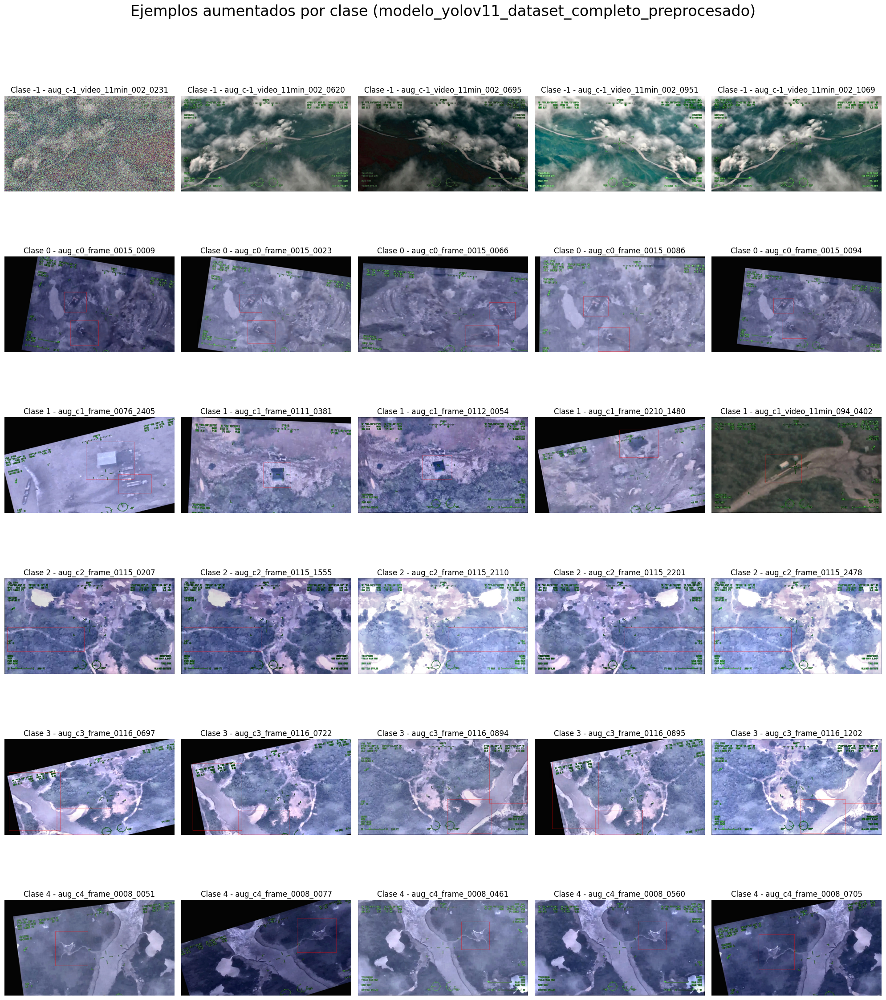

In [3]:
from pathlib import Path
from collections import defaultdict
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

DATASET_DIR = Path("preprocesamiento/modelo_yolov11_dataset_completo_preprocesado")  
IMG_DIR = DATASET_DIR / "train" / "images"
LBL_DIR = DATASET_DIR / "train" / "labels"
CLASES = [-1, 0, 1, 2, 3, 4] 

imagenes_por_clase = defaultdict(list)

for txt_path in sorted(LBL_DIR.glob("*.txt")):
    lines = txt_path.read_text().splitlines()

    if not lines and len(imagenes_por_clase[-1]) < 5:
        imagenes_por_clase[-1].append(txt_path.stem)
        continue

    clases_en_archivo = set()
    for line in lines:
        parts = line.strip().split()
        if len(parts) >= 5:
            try:
                class_id = int(parts[0])
                if class_id in CLASES:
                    clases_en_archivo.add(class_id)
            except ValueError:
                continue

    for cls_id in clases_en_archivo:
        if len(imagenes_por_clase[cls_id]) < 5:
            imagenes_por_clase[cls_id].append(txt_path.stem)

fig, axes = plt.subplots(len(CLASES), 5, figsize=(20, 4 * len(CLASES)))
fig.suptitle(f"Ejemplos aumentados por clase ({DATASET_DIR.name})", fontsize=24)

for row, class_id in enumerate(CLASES):
    for col in range(5):
        ax = axes[row, col]
        if col >= len(imagenes_por_clase[class_id]):
            ax.axis('off')
            continue

        stem = imagenes_por_clase[class_id][col]
        img_path = IMG_DIR / f"{stem}.jpg"
        lbl_path = LBL_DIR / f"{stem}.txt"

        if not img_path.exists() or not lbl_path.exists():
            ax.axis('off')
            continue

        img = Image.open(img_path).convert("RGB")
        draw = ImageDraw.Draw(img)
        w, h = img.size

        if class_id != -1:
            for line in lbl_path.read_text().splitlines():
                parts = line.strip().split()
                if len(parts) < 5:
                    continue
                cls_id, x_c, y_c, bw, bh = map(float, parts[:5])
                if int(cls_id) != class_id:
                    continue

                cx, cy = x_c * w, y_c * h
                bw_pix, bh_pix = bw * w, bh * h
                x1, y1 = cx - bw_pix / 2, cy - bh_pix / 2
                x2, y2 = cx + bw_pix / 2, cy + bh_pix / 2
                draw.rectangle([x1, y1, x2, y2], outline='red', width=2)

        ax.imshow(img)
        ax.set_title(f"Clase {class_id} - {stem}")
        ax.axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.94)
plt.show()


Una vez realizado esto para todas las categorias, ahora si podemos realizar la primera parte del modelo